In [203]:
import pandas as pd
from models import Battery

import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Mock.py

In [204]:
!uv run mock.py

Generated 35136 data points for 2024
Date range: 2024-01-01 00:00:00 to 2024-12-31 23:45:00

DataFrame columns: ['DayOfYear', 'HourOfDay', 'DayOfWeek', 'HomeGeneration', 'HomeConsumption', 'PriceSignal']

Battery setup: capacity=100.0 max_charge_rate=20.0 max_discharge_rate=20.0 current_soc=50.0 final_soc=50.0 charging_efficiency=0.98 discharging_efficiency=0.98 soc_min=10.0 soc_max=90.0 grid_import_limit=1.0 grid_export_limit=1.0

Sample data preview:
                     DayOfYear  HourOfDay  ...  HomeConsumption  PriceSignal
2024-01-01 00:00:00          1       0.00  ...         3.035247   100.649966
2024-01-01 00:15:00          1       0.25  ...         4.198418   108.187603
2024-01-01 00:30:00          1       0.50  ...         3.015899   120.303569
2024-01-01 00:45:00          1       0.75  ...         2.898689   105.608502
2024-01-01 01:00:00          1       1.00  ...         4.112579   119.663848

[5 rows x 6 columns]

Price signal stats (€/MWh):
Min: -83.4
Max: 158.0
Mean: 89

In [205]:
battery_setup_json = open('cache/battery_setup.json', 'r').read()
print(battery_setup_json)

{
    "capacity": 100.0,
    "max_charge_rate": 20.0,
    "max_discharge_rate": 20.0,
    "current_soc": 50.0,
    "final_soc": 50.0,
    "charging_efficiency": 0.98,
    "discharging_efficiency": 0.98,
    "soc_min": 10.0,
    "soc_max": 90.0,
    "grid_import_limit": 1.0,
    "grid_export_limit": 1.0
}


In [206]:
battery_setup = Battery.model_validate_json(battery_setup_json)
battery_setup

Battery(capacity=100.0, max_charge_rate=20.0, max_discharge_rate=20.0, current_soc=50.0, final_soc=50.0, charging_efficiency=0.98, discharging_efficiency=0.98, soc_min=10.0, soc_max=90.0, grid_import_limit=1.0, grid_export_limit=1.0)

In [207]:
df_energy = pd.read_parquet('cache/df_energy.parquet')
df_energy

,DayOfYear,HourOfDay,DayOfWeek,HomeGeneration,HomeConsumption,PriceSignal
2024-01-01 00:00:00,1,0.00,0,0.0,3.035247,100.649966
2024-01-01 00:15:00,1,0.25,0,0.0,4.198418,108.187603
2024-01-01 00:30:00,1,0.50,0,0.0,3.015899,120.303569
2024-01-01 00:45:00,1,0.75,0,0.0,2.898689,105.608502
2024-01-01 01:00:00,1,1.00,0,0.0,4.112579,119.663848
...,...,...,...,...,...,...
2024-12-31 22:45:00,366,22.75,1,0.0,4.329018,107.756358
2024-12-31 23:00:00,366,23.00,1,0.0,3.346362,124.013647
2024-12-31 23:15:00,366,23.25,1,0.0,4.734271,116.703751
2024-12-31 23:30:00,366,23.50,1,0.0,4.309025,115.619819


In [208]:
# Assuming you have your df_energy loaded
fig = make_subplots(
    rows=len(df_energy.columns), 
    cols=1,
    subplot_titles=df_energy.columns,
    shared_xaxes=True
)

for i, col in enumerate(df_energy.columns, 1):
    fig.add_trace(
        go.Scatter(x=df_energy.index, y=df_energy[col], name=col),
        row=i, col=1
    )

fig.update_layout(height=300*len(df_energy.columns), width=800)


In [209]:
# Hourly patterns for all signals by day of week

# Group by both hour and day of week for all columns
hourly_weekday = df_energy.groupby([df_energy.index.hour, df_energy.index.dayofweek]).agg({
    'HomeGeneration': 'mean',
    'HomeConsumption': 'mean',
    'PriceSignal': 'mean'
}).reset_index()
hourly_weekday.columns = ['Hour', 'DayOfWeek', 'HomeGeneration', 'HomeConsumption', 'PriceSignal']

# Day names and colors
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
colors = ['blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink']

# Create subplots
fig = make_subplots(
    rows=3, cols=1,
    subplot_titles=['Home Generation (kW)', 'Home Consumption (kW)', 'Price Signal (€/MWh)'],
    shared_xaxes=True
)

# Add traces for each signal and each day of week
signals = ['HomeGeneration', 'HomeConsumption', 'PriceSignal']

for row_idx, signal in enumerate(signals, 1):
    for day_idx in range(7):
        day_data = hourly_weekday[hourly_weekday.DayOfWeek == day_idx]
        
        fig.add_trace(go.Scatter(
            x=day_data.Hour,
            y=day_data[signal],
            mode='lines+markers',
            name=day_names[day_idx],
            line=dict(color=colors[day_idx], width=2),
            showlegend=(row_idx == 1)  # Only show legend on first subplot
        ), row=row_idx, col=1)

fig.update_layout(
    title='Average Energy Patterns by Hour of Day - Per Day of Week',
    height=1000,
    width=800,
    legend=dict(
        orientation="v",
        yanchor="top",
        y=1,
        xanchor="left",
        x=1.02
    )
)

fig.update_xaxes(title_text='Hour of Day', row=3, col=1)
fig.show()

In [210]:
# Seasonal patterns: Group by month, show monthly averages

# Group by month and calculate means
monthly_avg = df_energy.groupby(df_energy.index.month).agg({
    'HomeGeneration': 'mean',
    'HomeConsumption': 'mean',
    'PriceSignal': 'mean'
}).reset_index()

# Month names for x-axis
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=month_names,
    y=monthly_avg.HomeGeneration,
    mode='lines+markers',
    name='Home Generation (kW)',
    line=dict(color='orange')
))

fig.add_trace(go.Scatter(
    x=month_names,
    y=monthly_avg.HomeConsumption,
    mode='lines+markers',
    name='Home Consumption (kW)',
    line=dict(color='blue'),
    yaxis='y2'
))

fig.add_trace(go.Scatter(
    x=month_names,
    y=monthly_avg.PriceSignal,
    mode='lines+markers',
    name='Price Signal (€/MWh)',
    line=dict(color='red'),
    yaxis='y3'
))

fig.update_layout(
    title='Seasonal Patterns - Monthly Averages',
    xaxis=dict(title='Month'),
    yaxis=dict(title='Generation (kW)', side='left', color='orange'),
    yaxis2=dict(title='Consumption (kW)', side='right', overlaying='y', color='blue'),
    yaxis3=dict(title='Price (€/MWh)', side='right', overlaying='y', position=0.85, color='red'),
    height=500,
    width=800
)

fig.show()

# Optimize.py

In [211]:
import pandas as pd
from models import Battery

In [212]:
!uv run optimize.py 2024-06-01 2024-06-08

Optimization completed successfully
Total profit with battery:            €4.65
Total profit without battery (baseline): €-4.14
Difference:                           €8.78
Final SoC: 50.00 kWh (target: 50.0 kWh)


In [213]:
df_result = pd.read_parquet('cache/df_result.parquet')
df_result

,DayOfYear,HourOfDay,DayOfWeek,HomeGeneration,HomeConsumption,PriceSignal,BatteryCharge,BatteryDischarge,GridImport,GridExport,SoC,BaselineGridExport,BaselineGridImport,BaselineProfit,BaselineCumulativeProfit,BatteryProfit,BatteryCumulativeProfit
2024-06-01 00:00:00,153,0.00,5,0.0,1.237825,57.309821,0.000000,0.237825,1.0,0.0,49.939330,0.0,1.237825,-0.017735,-0.017735,-0.014327,-0.014327
2024-06-01 00:15:00,153,0.25,5,0.0,0.836907,37.106538,0.163093,0.000000,1.0,0.0,49.979288,0.0,0.836907,-0.007764,-0.025499,-0.009277,-0.023604
2024-06-01 00:30:00,153,0.50,5,0.0,1.089720,49.595190,0.000000,0.089720,1.0,0.0,49.956400,0.0,1.089720,-0.013511,-0.039010,-0.012399,-0.036003
2024-06-01 00:45:00,153,0.75,5,0.0,0.856705,60.390452,0.143295,0.000000,1.0,0.0,49.991508,0.0,0.856705,-0.012934,-0.051944,-0.015098,-0.051101
2024-06-01 01:00:00,153,1.00,5,0.0,1.018320,62.030506,0.000000,0.018320,1.0,0.0,49.986834,0.0,1.018320,-0.015792,-0.067736,-0.015508,-0.066608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-07 23:00:00,159,23.00,4,0.0,1.342908,87.609580,0.000000,2.342908,0.0,1.0,51.873131,0.0,1.342908,-0.029413,-4.037271,0.021902,4.607347
2024-06-07 23:15:00,159,23.25,4,0.0,1.452374,71.844164,0.000000,2.452374,0.0,1.0,51.247526,0.0,1.452374,-0.026086,-4.063357,0.017961,4.625308
2024-06-07 23:30:00,159,23.50,4,0.0,1.365123,80.261980,0.000000,2.365123,0.0,1.0,50.644178,0.0,1.365123,-0.027392,-4.090749,0.020065,4.645373
2024-06-07 23:45:00,159,23.75,4,0.0,1.736926,66.376331,0.000000,0.736926,1.0,0.0,50.456187,0.0,1.736926,-0.028823,-4.119572,-0.016594,4.628779


In [214]:
fig = make_subplots(
    rows=3, cols=1, shared_xaxes=True,
    subplot_titles=(
        "Battery Charge/Discharge (kW)",
        "Battery State of Charge (SoC) (kWh)",
        "Price Signal (€/MWh)"
    ),
    vertical_spacing=0.02
)

# Stacked bars for charge/discharge
fig.add_trace(
    go.Bar(
        x=df_result.index,
        y=df_result['BatteryCharge'],
        name='Battery Charge',
        marker_color='green'
    ),
    row=1, col=1
)
fig.add_trace(
    go.Bar(
        x=df_result.index,
        y=-df_result['BatteryDischarge'],
        name='Battery Discharge',
        marker_color='red'
    ),
    row=1, col=1
)

# SoC line
fig.add_trace(
    go.Scatter(
        x=df_result.index,
        y=df_result['SoC'],
        name='Battery SoC',
        line=dict(color='blue', width=2)
    ),
    row=2, col=1
)

# Price signal
fig.add_trace(
    go.Scatter(
        x=df_result.index,
        y=df_result['PriceSignal'] / 1000,  # Convert to €/kWh for visualization
        name='Price Signal',
        line=dict(color='orange', dash='dot', width=1)
    ),
    row=3, col=1
)

# Layout
fig.update_layout(
    height=1000,
    width=1000,
    title="Battery Operation Overview",
    yaxis_title="Power (kW)",
    yaxis2_title="Battery SoC (kWh)",
    yaxis3_title="Price (€/kWh)",
    showlegend=True
)
fig.show()

In [215]:
# Extract totals
baseline_export = round(df_result['BaselineGridExport'].sum(), 1)
baseline_import = round(df_result['BaselineGridImport'].sum(), 1)
battery_export  = round(df_result['GridExport'].sum(), 1)
battery_import  = round(df_result['GridImport'].sum(), 1)

# Define the data for two groups: ['Import', 'Export']
baseline_data = [baseline_import, baseline_export]
battery_data = [battery_import, battery_export]
x_labels = ['Import', 'Export']

# Create the figure
fig = go.Figure()

# Adds the first group: Baseline bars
fig.add_trace(go.Bar(
    x=x_labels,
    y=baseline_data,
    name='Baseline',
    text=baseline_data,
    textposition='auto',
    marker_color='rgba(0, 150, 255, 1)',
))

# Adds the second group: Battery bars
fig.add_trace(go.Bar(
    x=x_labels,
    y=battery_data,
    name='Battery',
    text=battery_data,
    textposition='auto',
    marker_color='rgba(255, 100, 100, 1)',
))

# Final touches
fig.update_layout(
    title="Grid Import and Export Totals",
    xaxis_title="Grid Type",
    yaxis_title="Energy (kWh)",
    barmode='group',
    bargap=0.3,  # gap between bar groups
    bargroupgap=0.1,  # gap between bars in a group
)

# Show the plot
fig.show()

In [216]:
fig = make_subplots(
    rows=1, cols=1,
)

fig.add_trace(
    go.Scatter(
        x=df_result.index,
        y=df_result['BaselineCumulativeProfit'],
        name='Baseline Profit',
        line=dict(color='red', dash='dot', width=2)
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_result.index,
        y=df_result['BatteryCumulativeProfit'],
        name='Battery Profit',
        line=dict(color='blue', width=2)
    ),
    row=1, col=1
)

fig.update_layout(
    title="Cumulative Profit Comparison Over Time",
    height=400,
    width=1000,
    yaxis_title='Cumulative Profit (€)',
    xaxis_title='Time',
    showlegend=True,
    legend=dict(x=0.7, y=1.1)
)

fig.show()

In [217]:
import pandas as pd

compare_table = pd.DataFrame({
    "Metric": ["Total Baseline Export (kWh)", "Total Battery Export (kWh)", "Difference (kWh)",
               "Total Baseline Import (kWh)", "Total Battery Import (kWh)", "Difference (kWh)",
               "Cumulative Profit (€) - Baseline", "Cumulative Profit (€) - Battery", "Net Gain (€)"],
    "Value": [
        baseline_export, battery_export, battery_export - baseline_export,
        baseline_import, battery_import, battery_import - baseline_import,
        df_result['BaselineCumulativeProfit'].iloc[-1],
        df_result['BatteryCumulativeProfit'].iloc[-1],
        df_result['BatteryCumulativeProfit'].iloc[-1] - df_result['BaselineCumulativeProfit'].iloc[-1]
    ]
})

compare_table.set_index('Metric')

,Value
Metric,
Total Baseline Export (kWh),1061.300000
Total Battery Export (kWh),401.500000
Difference (kWh),-659.800000
Total Baseline Import (kWh),881.700000
Total Battery Import (kWh),268.100000
Difference (kWh),-613.600000
Cumulative Profit (€) - Baseline,-4.135061
Cumulative Profit (€) - Battery,4.648430
Net Gain (€),8.783491


# Todo
- Check baseline vs optimization result for
  - Energy balance 
  - Total self consumption the same
  - 

In [218]:
fig = make_subplots(
    rows=10, cols=1, 
    shared_xaxes=True,
    subplot_titles=(
        "Home Generation & Consumption",
        "Battery Operations", 
        "Net Grid Flow (Import+ Export-)",
        "State of Charge",
        "Price Signal",
        "Profit Comparison",
        "Baseline vs Optimized Net Grid",
        "Cumulative Profit",
        "Energy Balance Check",
        "Day/Hour Patterns"
    ),
    vertical_spacing=0.02
)

# Home Generation & Consumption
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HomeGeneration'], name='Home Generation'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HomeConsumption'], name='Home Consumption'), row=1, col=1)

# Battery Operations
fig.add_trace(go.Bar(x=df_result.index, y=df_result['BatteryCharge'], name='Battery Charge', width=300000), row=2, col=1)
fig.add_trace(go.Bar(x=df_result.index, y=-df_result['BatteryDischarge'], name='Battery Discharge', width=300000), row=2, col=1)

# Net Grid Flow
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['GridImport'] - df_result['GridExport'], name='Net Grid Flow'), row=3, col=1)

# State of Charge
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['SoC'], name='Battery SoC'), row=4, col=1)

# Price Signal
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['PriceSignal'], name='Price Signal'), row=5, col=1)

# Profit Comparison
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BaselineProfit'], name='Baseline Profit'), row=6, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BatteryProfit'], name='Battery Profit'), row=6, col=1)

# Baseline vs Optimized Net Grid
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BaselineGridImport'] - df_result['BaselineGridExport'], name='Baseline Net Grid'), row=7, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['GridImport'] - df_result['GridExport'], name='Optimized Net Grid'), row=7, col=1)

# Cumulative Profit
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BaselineCumulativeProfit'], name='Baseline Cumulative'), row=8, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BatteryCumulativeProfit'], name='Battery Cumulative'), row=8, col=1)

# Energy Balance Check
energy_balance = df_result['HomeGeneration'] - df_result['HomeConsumption'] + df_result['BatteryDischarge'] - df_result['BatteryCharge'] - df_result['GridExport'] + df_result['GridImport']
fig.add_trace(go.Scatter(x=df_result.index, y=energy_balance, name='Energy Balance'), row=9, col=1)

# Day/Hour Patterns
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HourOfDay'], name='Hour of Day'), row=10, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['DayOfWeek'], name='Day of Week'), row=10, col=1)

fig.update_layout(
    height=2000, 
    title="Battery Optimization Physics Check",
    hovermode='x unified'
)

fig.update_xaxes(matches='x')

fig.show()

In [219]:
df_result.HomeConsumption.sum() - df_result.HomeGeneration.sum()

np.float64(-179.5492173910734)

In [220]:
df_result.HomeGeneration.sum()


np.float64(1350.0294839525507)

In [221]:
df_result.HomeConsumption.sum() 

np.float64(1170.4802665614773)

In [222]:
cost_of_generation = df_result.HomeGeneration * df_result.PriceSignal * -1
cost_of_generation.sum()

np.float64(-76934.4058791677)

In [223]:
cost_of_consumption = df_result.HomeConsumption * df_result.PriceSignal
cost_of_consumption.sum()

np.float64(93474.65185651091)

In [224]:
total_charge = df_result.BatteryCharge.sum()
total_charge

np.float64(1163.6570119839998)

In [225]:

total_discharge = df_result.BatteryDischarge.sum()
total_discharge

np.float64(1117.5761966107)

<Axes: >

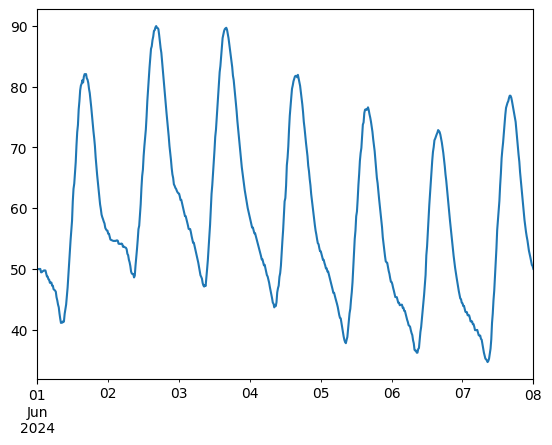

In [226]:
df_result.SoC.plot()

In [227]:
fig = make_subplots(
    rows=10, cols=1, 
    shared_xaxes=True,
    subplot_titles=(
        "Home Generation & Consumption + Net",
        "Battery Operations", 
        "Net Grid Flow (Import+ Export-)",
        "State of Charge",
        "Price Signal",
        "Profit Comparison",
        "Baseline vs Optimized Net Grid",
        "Cumulative Profit",
        "Energy Balance Check",
        "Day/Hour Patterns"
    ),
    vertical_spacing=0.02
)

# Home Generation & Consumption + Net
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HomeGeneration'], name='Home Generation'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HomeConsumption'], name='Home Consumption'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HomeGeneration'] - df_result['HomeConsumption'], name='Net (Gen-Cons)'), row=1, col=1)

# Battery Operations (line graphs)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BatteryCharge'], name='Battery Charge', line=dict(color='green')), row=2, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BatteryDischarge'], name='Battery Discharge', line=dict(color='red')), row=2, col=1)

# Net Grid Flow
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['GridImport'] - df_result['GridExport'], name='Net Grid Flow'), row=3, col=1)

# State of Charge
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['SoC'], name='Battery SoC'), row=4, col=1)

# Price Signal
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['PriceSignal'], name='Price Signal'), row=5, col=1)

# Profit Comparison
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BaselineProfit'], name='Baseline Profit'), row=6, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BatteryProfit'], name='Battery Profit'), row=6, col=1)

# Baseline vs Optimized Net Grid
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BaselineGridImport'] - df_result['BaselineGridExport'], name='Baseline Net Grid'), row=7, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['GridImport'] - df_result['GridExport'], name='Optimized Net Grid'), row=7, col=1)

# Cumulative Profit
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BaselineCumulativeProfit'], name='Baseline Cumulative'), row=8, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['BatteryCumulativeProfit'], name='Battery Cumulative'), row=8, col=1)

# Energy Balance Check
energy_balance = df_result['HomeGeneration'] - df_result['HomeConsumption'] + df_result['BatteryDischarge'] - df_result['BatteryCharge'] - df_result['GridExport'] + df_result['GridImport']
fig.add_trace(go.Scatter(x=df_result.index, y=energy_balance, name='Energy Balance'), row=9, col=1)

# Day/Hour Patterns
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['HourOfDay'], name='Hour of Day'), row=10, col=1)
fig.add_trace(go.Scatter(x=df_result.index, y=df_result['DayOfWeek'], name='Day of Week'), row=10, col=1)

fig.update_layout(
    height=2000, 
    title="Battery Optimization Physics Check",
    hovermode='x unified'
)

fig.update_xaxes(matches='x')

fig.show()

In [228]:
energy_balance = df_result['HomeGeneration'] - df_result['HomeConsumption'] + df_result['BatteryDischarge'] - df_result['BatteryCharge'] - df_result['GridExport'] + df_result['GridImport']
print(f"Energy balance check - should be near zero: {energy_balance.abs().max()}")
print(f"Mean absolute energy balance: {energy_balance.abs().mean()}")

Energy balance check - should be near zero: 4.922718819244665e-07
Mean absolute energy balance: 2.6648876023421513e-08
